In [27]:
import argparse
import logging
import os
import sys
from datetime import datetime, timedelta

import numpy as np
import torch
import PIL
from PIL import Image
from torch.optim import Adam
from torchvision import transforms

import config
import network
from dataset import preprocess_dataset, VoxCelebDatasetForFewShotInference, VoxCelebDataset
from torch.utils.data import Dataset

import matplotlib.pyplot as plt

from face_alignment import FaceAlignment, LandmarksType

In [2]:
def load_model(model, continue_id):
    filename = f'{type(model).__name__}_{continue_id}.pth'
    model.load_state_dict(
        torch.load(
            os.path.join(config.MODELS_DIR,
                         filename)
        )
    )
    return model

def imshow(data):
    data = data.clone().detach().cpu()

    std = np.array([0.229, 0.224, 0.225]).reshape((3, 1, 1))
    mean = np.array([0.485, 0.456, 0.406]).reshape((3, 1, 1))
    img = data.numpy()
    img = ((img * std + mean).transpose(1, 2, 0) * 255.0).clip(0, 255).astype("uint8")
    plt.imshow(img)
    plt.show()

def save_image(filename, data):
    data = data.clone().detach().cpu()

    std = np.array([0.229, 0.224, 0.225]).reshape((3, 1, 1))
    mean = np.array([0.485, 0.456, 0.406]).reshape((3, 1, 1))
    img = data.numpy()
    img = ((img * std + mean).transpose(1, 2, 0)*255.0).clip(0, 255).astype("uint8")
    img = Image.fromarray(img)
    img.save(filename)

In [3]:
ngpu = 0
device='cuda:0' if (torch.cuda.is_available() and ngpu > 0) else 'cpu'
# GPU / CPU --------------------------------------------------------------------------------------------------------
if device is not None and device != 'cpu':
    dtype = torch.cuda.FloatTensor
    torch.cuda.set_device(device)
    logging.info(f'Running on GPU: {torch.cuda.current_device()}.')
else:
    dtype = torch.FloatTensor
    logging.info(f'Running on CPU.')

In [4]:
import cv2

cap = cv2.VideoCapture('/sata1t/voxceleb2/dev/mp4/id07377/U6beb20YPf8/00190.mp4')

n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
w = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
h = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

n_frames


129

In [21]:
dataset_path = '/home/antonio/dlc3/talking-heads/inference01'
print('Training using dataset located in {dataset_path}')
dataset = VoxCelebDatasetForFewShotInference(
    device=device,
    root=dataset_path,
    extension='.png',
    shuffle=False,
    shuffle_frames=False,
    transform=transforms.Compose([
            transforms.Resize(config.IMAGE_SIZE),
            transforms.CenterCrop(config.IMAGE_SIZE),
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
    ])
)

Training using dataset located in {dataset_path}


In [22]:
# NETWORK ----------------------------------------------------------------------------------------------------------
continue_id = '20190821_1054'
E = network.Embedder().type(dtype)
G = network.Generator().type(dtype)
D = network.Discriminator(143000).type(dtype)

if continue_id is not None:
    E = load_model(E, continue_id)
    G = load_model(G, continue_id)
    D = load_model(D, continue_id)

optimizer_E_G = Adam(
    params=list(E.parameters()) + list(G.parameters()),
    lr=config.LEARNING_RATE_E_G
)
optimizer_D = Adam(
    params=D.parameters(),
    lr=config.LEARNING_RATE_D
)

criterion_E_G = network.LossEG(device, feed_forward=True)
criterion_D = network.LossD(device)

In [23]:
dataset.__len__()

1

In [24]:
#for batch_num, (i, video) in enumerate(dataset):
#enum_ds = enumerate(dataset)

#batch_num, (i, video) = next(enum_ds)

#batch_start = datetime.now()

i, video = dataset.__getitem__(0)



image file path= /home/antonio/dlc3/talking-heads/inference01/sample-pic01.png


In [25]:
# Calculate average encoding vector for video
e_vectors = []
idx = 0
for s in video:
    x_s = s['frame'].type(dtype)
    y_s = s['landmarks'].type(dtype)
    print(x_s)
    print(y_s)
    print(x_s.shape)
    print(y_s.shape)
    e_vectors.append(E(x_s, y_s))
    idx = idx +1
    if idx >= 26:
        break
e_hat = torch.stack(e_vectors).mean(dim=0)



tensor([[[-0.1828, -0.2171, -0.2342,  ...,  1.3413,  1.3584,  1.3927],
         [-0.7822, -0.8164, -0.8507,  ...,  1.1015,  1.1358,  1.1700],
         [-0.8678, -0.9020, -0.9363,  ...,  1.0502,  1.1015,  1.1358],
         ...,
         [-1.7069, -1.7240, -1.7240,  ..., -1.6727, -1.7069, -1.7412],
         [-1.7069, -1.7240, -1.7240,  ..., -1.6727, -1.7069, -1.7412],
         [-1.6555, -1.7069, -1.7240,  ..., -1.6727, -1.6898, -1.7069]],

        [[-0.2325, -0.2850, -0.3200,  ...,  0.4153,  0.4678,  0.5028],
         [-0.8803, -0.9678, -0.9853,  ..., -0.0749, -0.0224, -0.0049],
         [-0.9678, -1.0378, -1.0728,  ..., -0.1450, -0.0924, -0.0574],
         ...,
         [-1.6155, -1.6506, -1.6681,  ..., -1.5980, -1.6155, -1.6155],
         [-1.6155, -1.6506, -1.6681,  ..., -1.5980, -1.6155, -1.6155],
         [-1.6155, -1.6506, -1.6681,  ..., -1.6155, -1.6331, -1.6331]],

        [[ 0.1651,  0.0605,  0.0082,  ...,  0.2696,  0.2696,  0.2696],
         [-0.4450, -0.5844, -0.6367,  ..., -0

In [28]:
landmark_dataset_path = '/sata1t/dataset/U6beb20YPf8'
print('Training using dataset located in {dataset_path}')
landmark_dataset = VoxCelebDataset(
    root=landmark_dataset_path,
    extension='.vid',
    shuffle=False,
    shuffle_frames=False,
    transform=transforms.Compose([
            #transforms.Resize(config.IMAGE_SIZE),
            #transforms.CenterCrop(config.IMAGE_SIZE),
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
    ])
)

Training using dataset located in {dataset_path}


In [29]:
landmark_dataset.__len__()

1

In [30]:
i, landmark_video = landmark_dataset.__getitem__(0)

In [31]:
t = landmark_video.pop()

In [32]:
# Generate frame using landmarks from frame t
x_t = t['frame'].type(dtype)
y_t = t['landmarks'].type(dtype)
x_hat = G(y_t, e_hat)

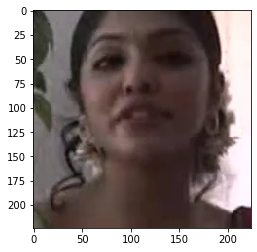

In [33]:
imshow(x_t)

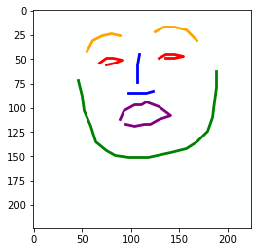

In [34]:
imshow(y_t)

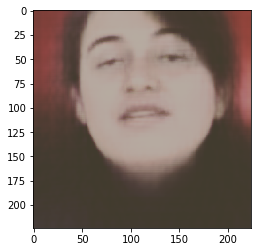

In [35]:
imshow(x_hat)

In [36]:
for s in landmark_video:
    x_s = s['frame'].type(dtype)
    y_s = s['landmarks'].type(dtype)
    x_hat = G(y_s, e_hat)

In [37]:
type(landmark_video)

list

0


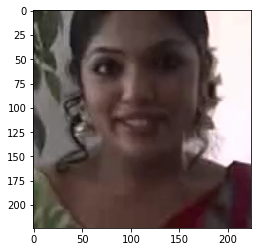

1


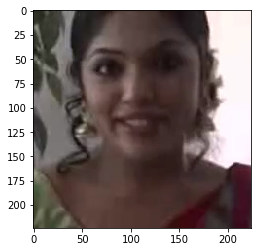

2


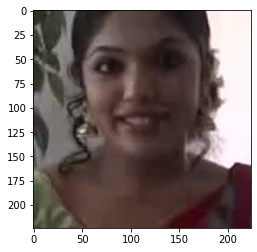

3


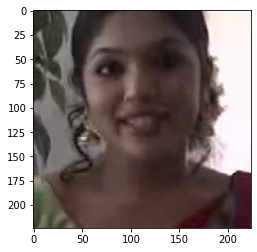

4


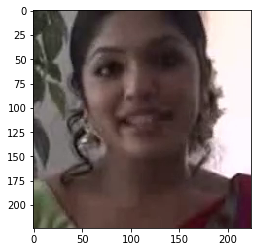

5


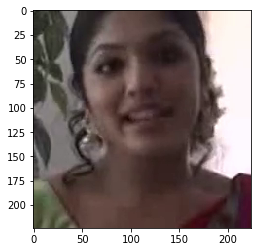

6


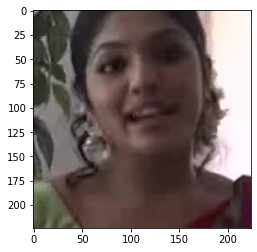

7


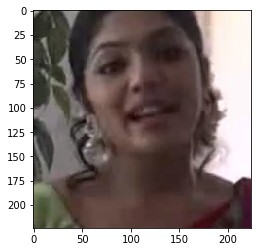

8


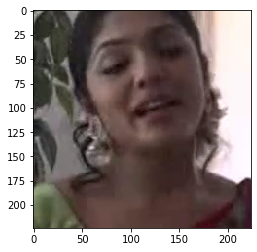

9


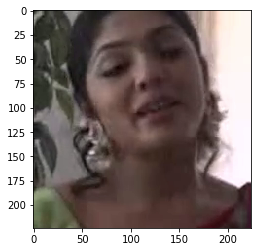

10


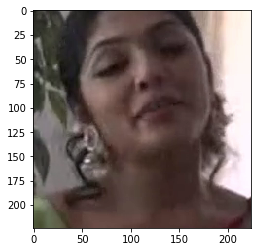

11


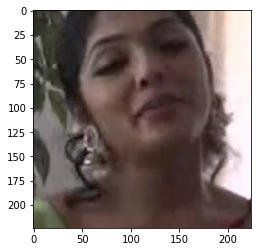

12


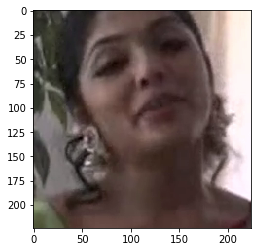

13


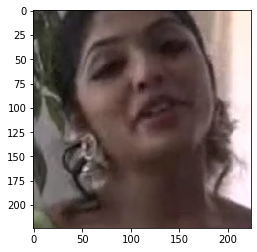

14


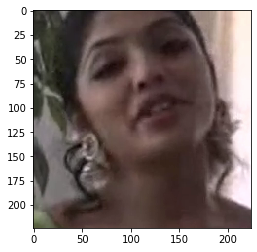

15


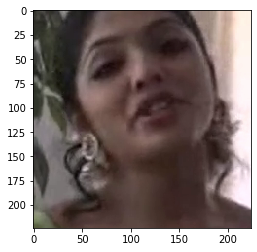

16


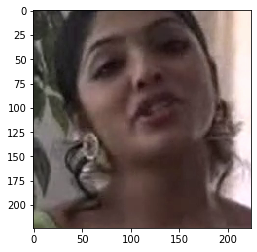

17


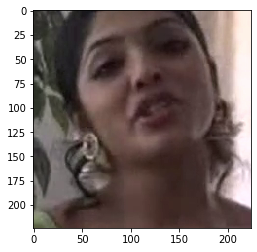

18


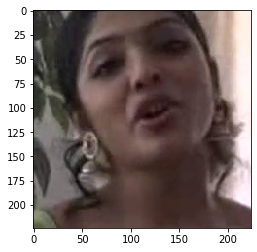

19


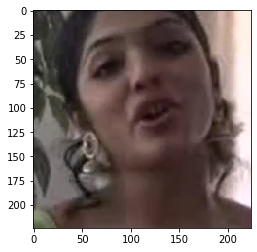

20


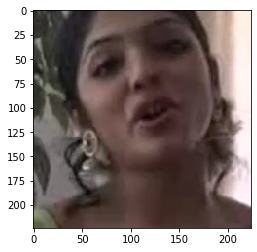

21


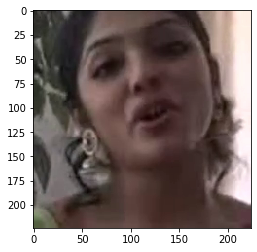

22


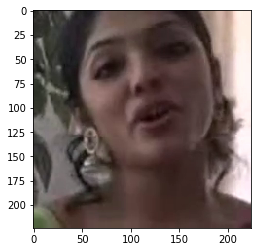

23


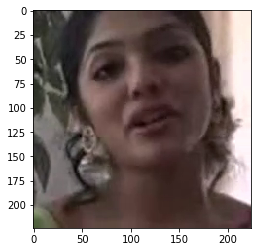

24


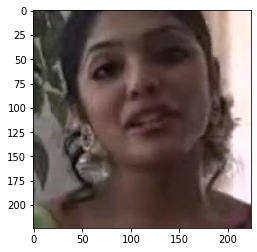

25


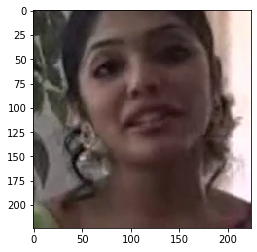

26


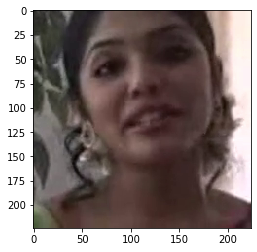

27


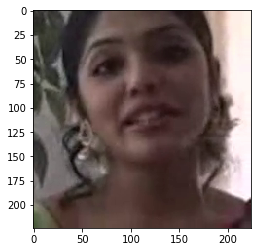

28


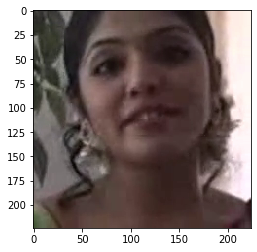

29


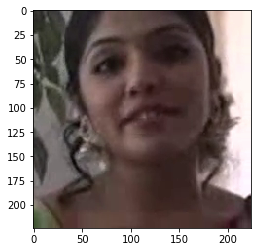

30


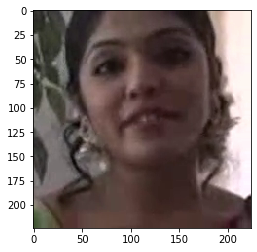

31


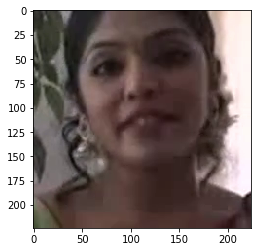

32


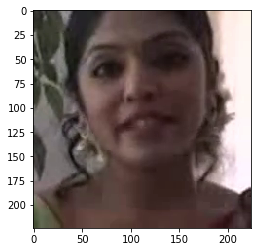

33


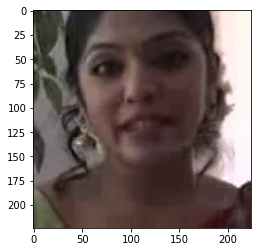

34


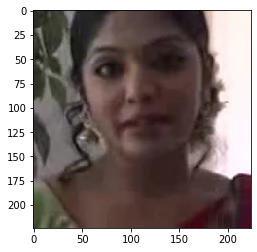

35


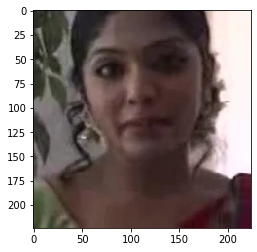

36


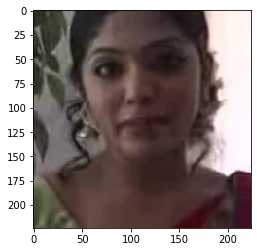

37


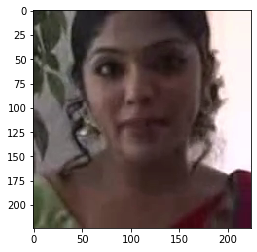

38


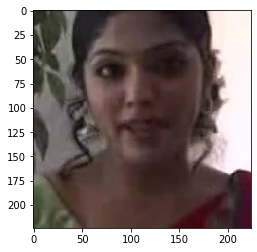

39


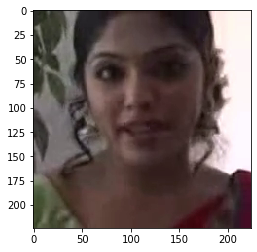

40


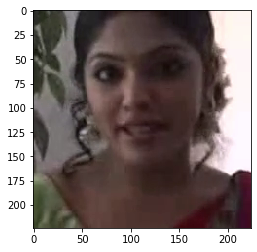

41


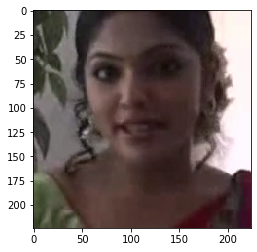

42


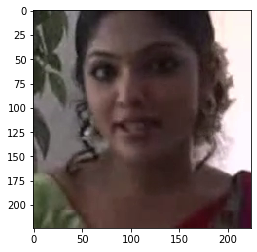

43


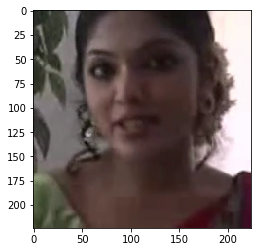

44


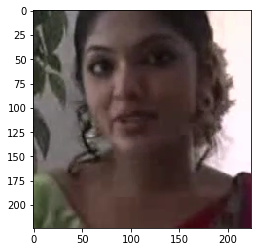

45


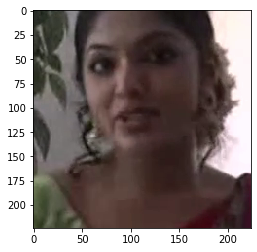

46


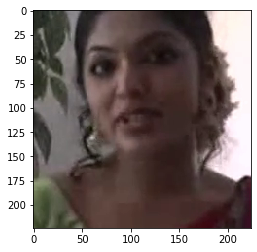

47


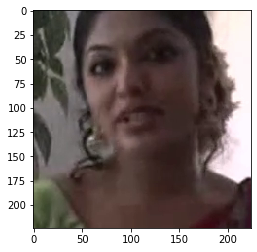

48


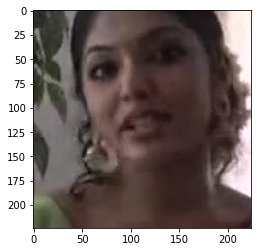

49


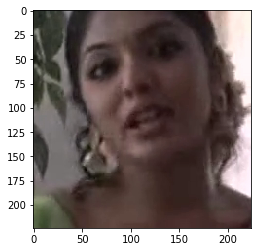

50


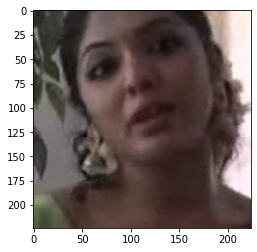

51


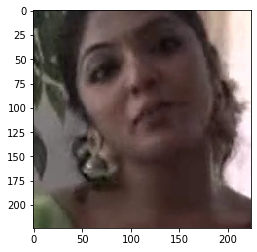

52


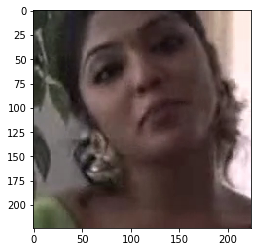

53


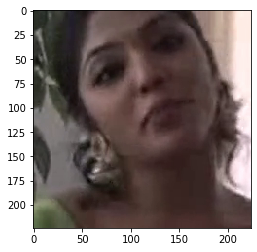

54


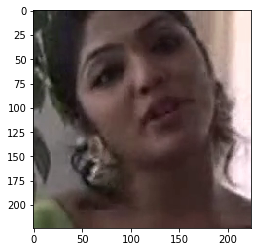

55


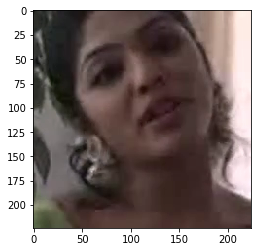

56


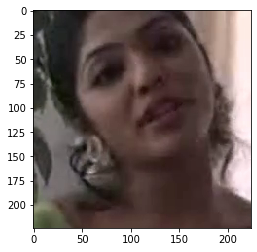

57


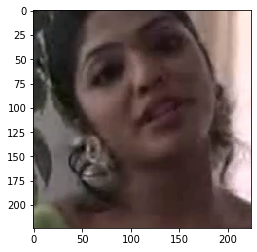

58


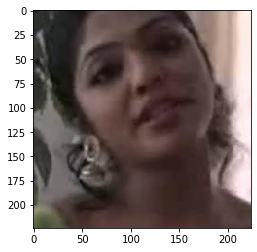

59


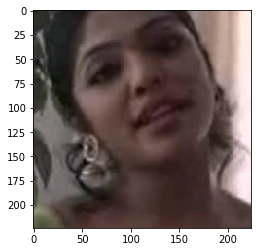

60


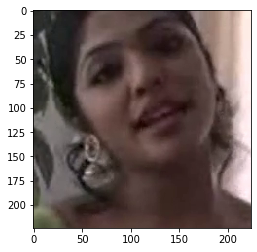

61


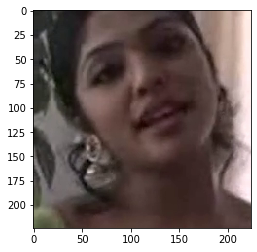

62


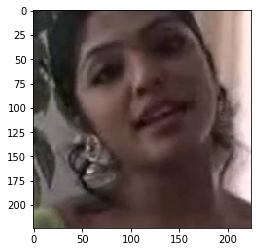

63


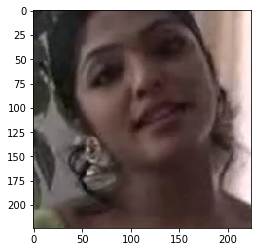

64


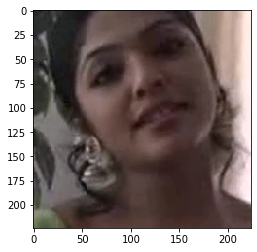

65


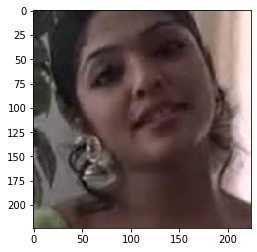

66


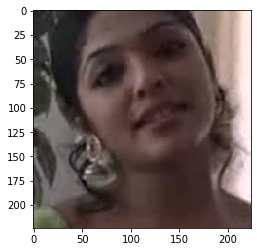

67


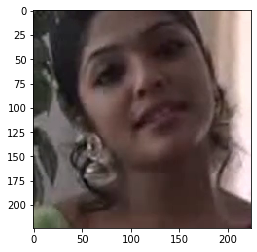

68


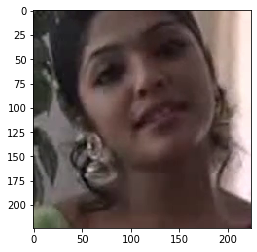

69


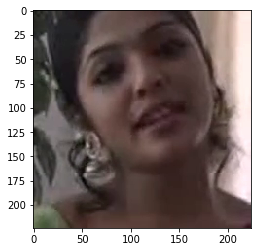

70


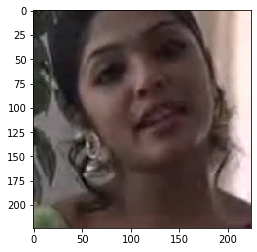

71


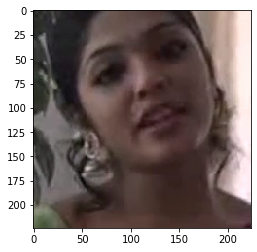

72


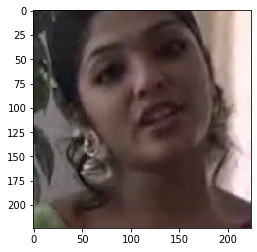

73


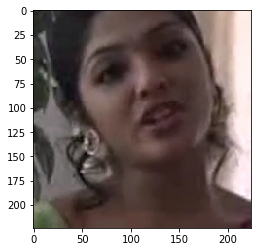

74


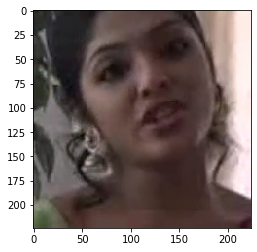

75


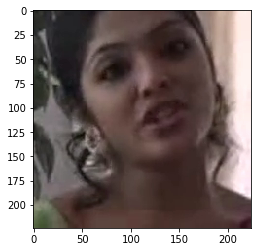

76


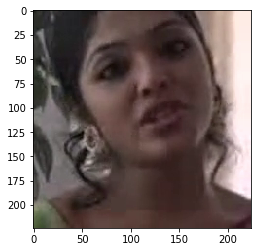

77


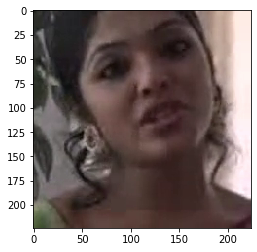

78


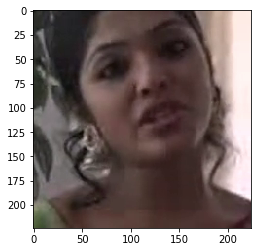

79


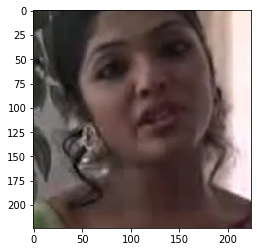

80


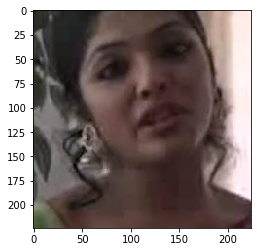

81


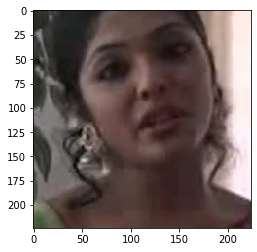

82


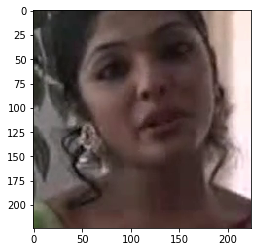

83


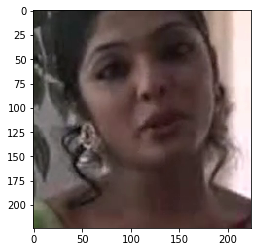

84


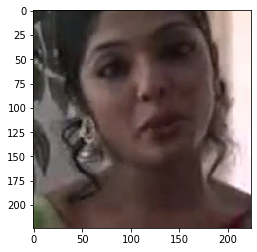

85


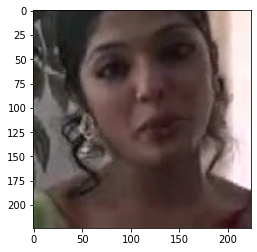

86


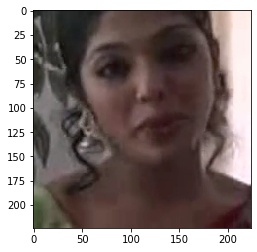

87


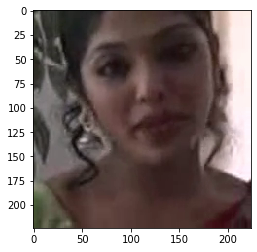

88


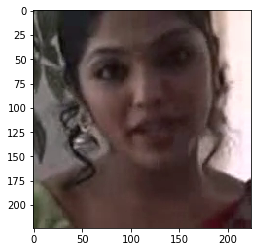

89


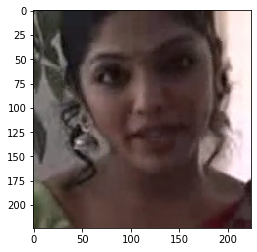

90


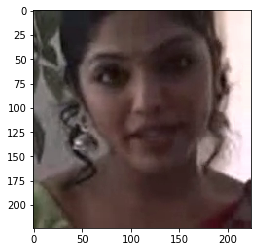

91


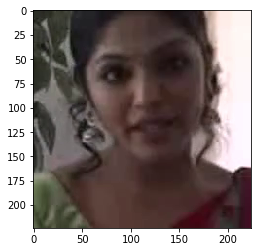

92


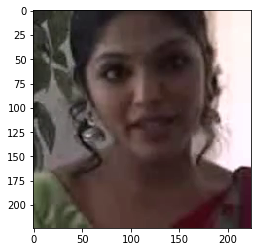

93


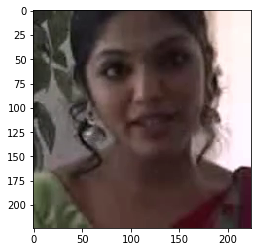

94


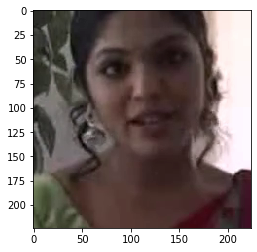

95


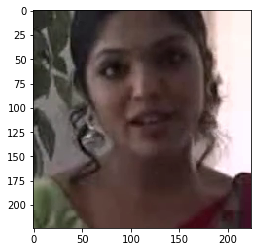

96


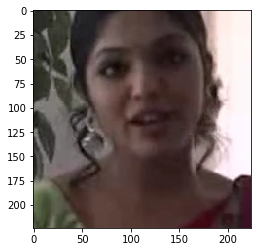

97


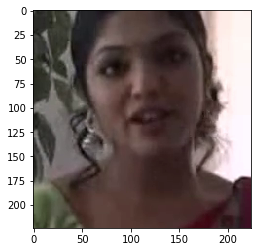

98


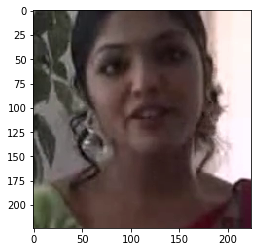

99


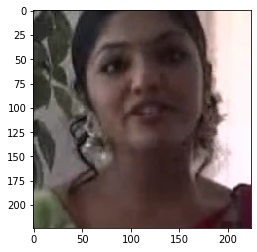

100


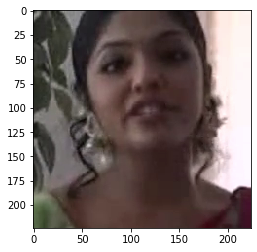

101


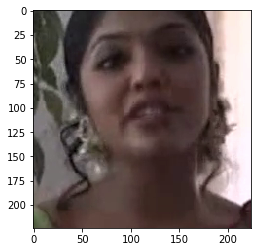

102


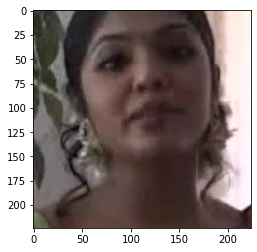

103


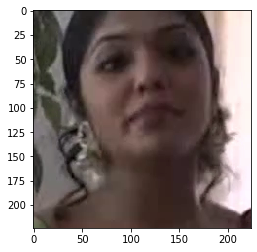

104


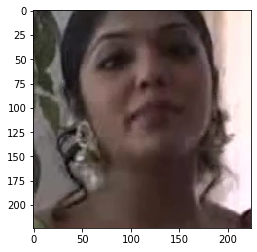

105


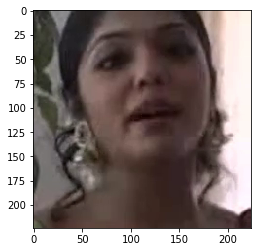

106


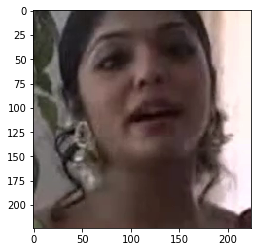

107


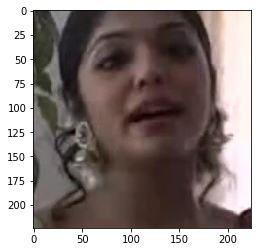

108


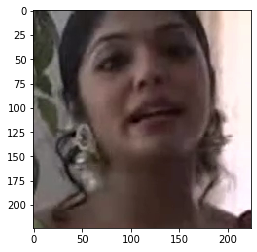

109


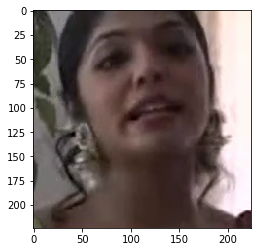

110


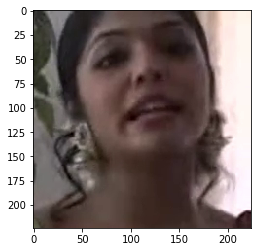

111


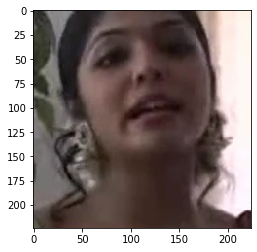

112


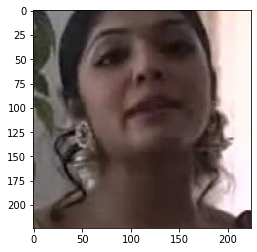

113


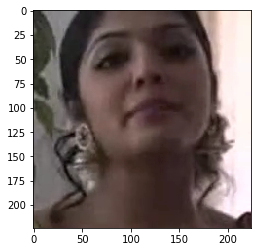

114


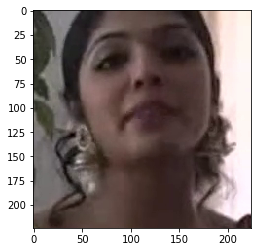

115


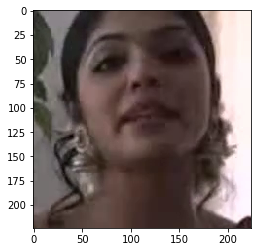

116


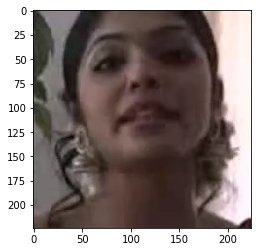

117


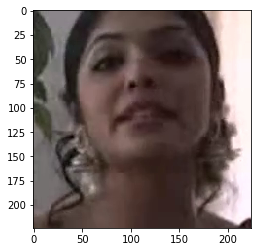

118


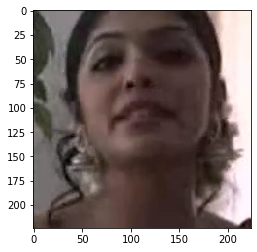

119


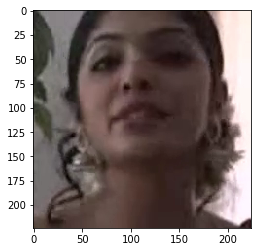

120


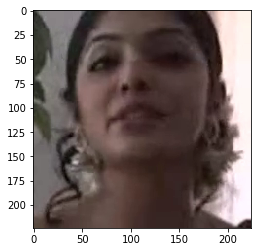

121


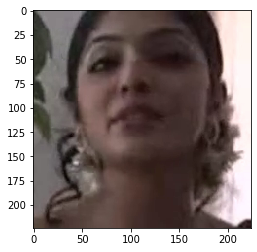

122


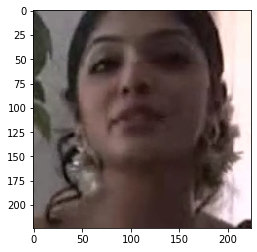

123


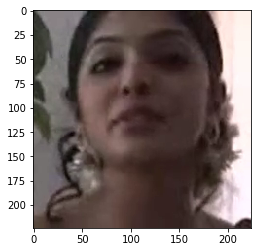

124


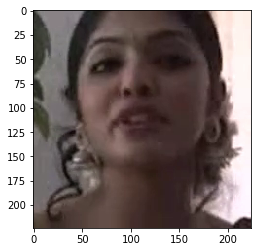

125


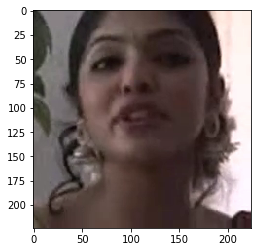

126


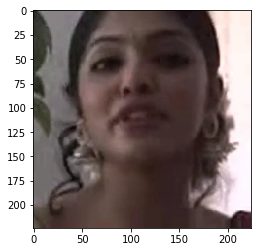

127


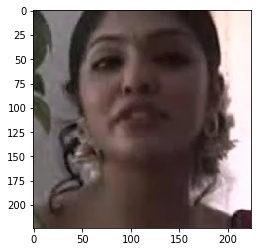

In [38]:
for i, s in enumerate(landmark_video):
    x_s = s['frame'].type(dtype)
    print(i)
    imshow(x_s)

0


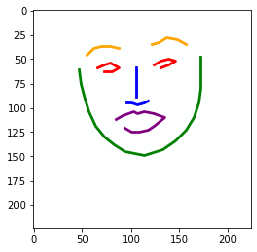

1


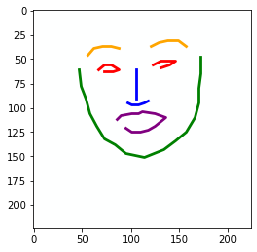

2


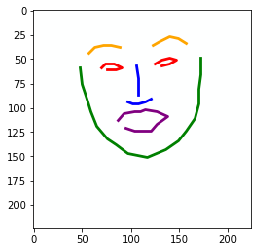

3


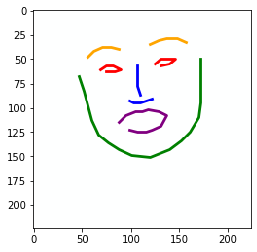

4


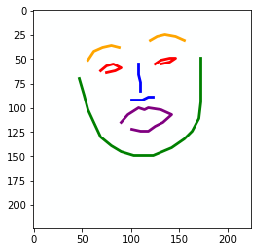

5


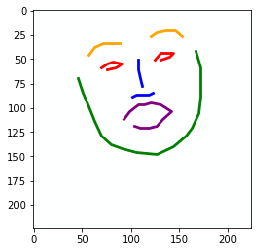

6


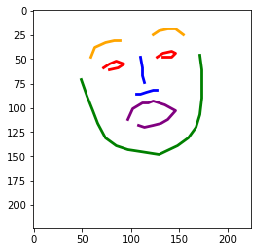

7


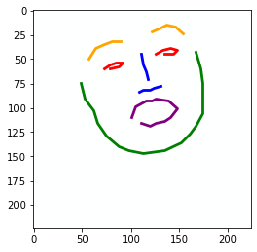

8


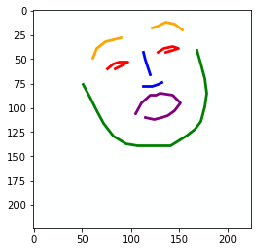

9


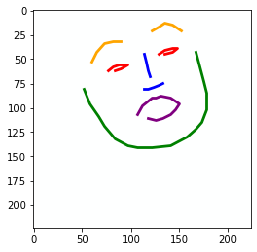

10


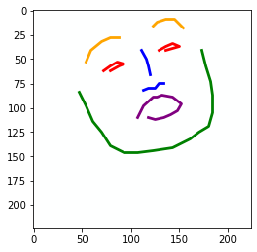

11


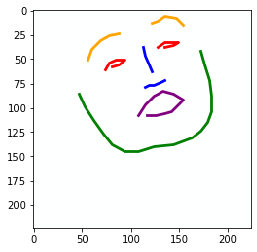

12


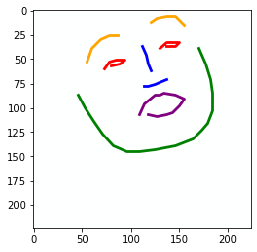

13


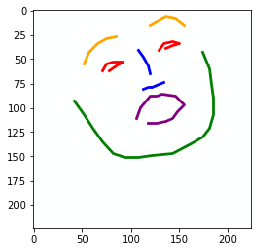

14


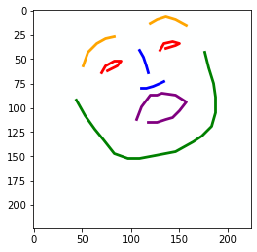

15


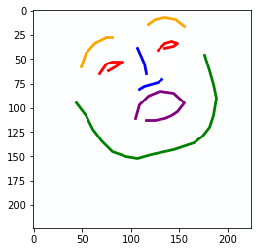

16


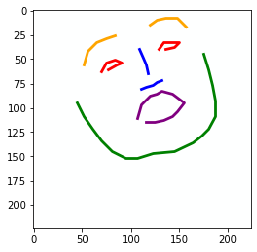

17


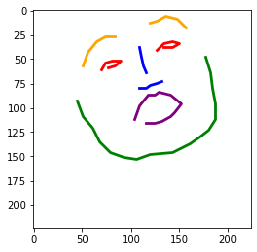

18


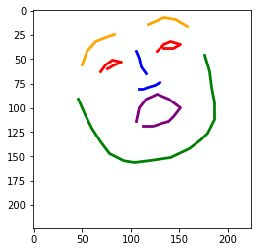

19


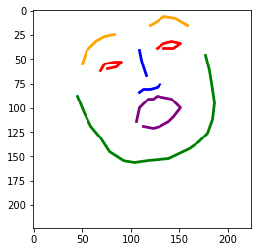

20


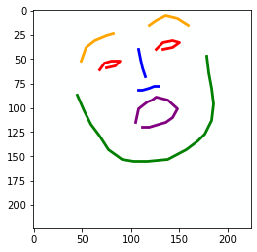

21


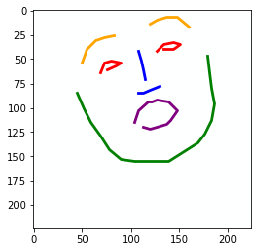

22


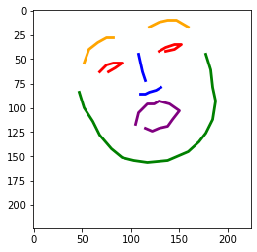

23


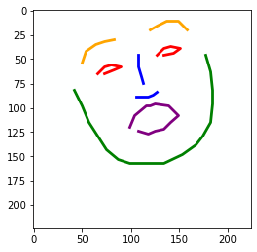

24


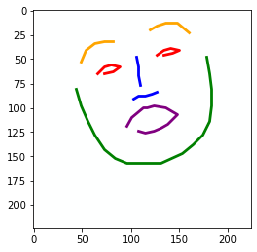

25


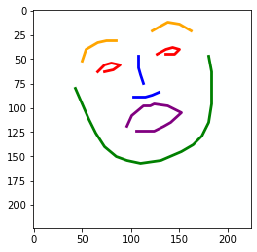

26


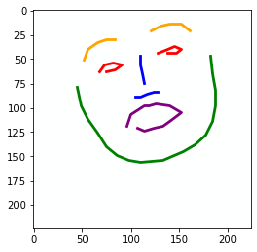

27


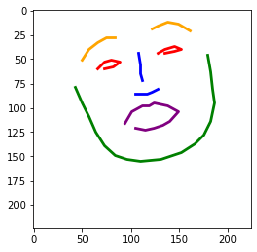

28


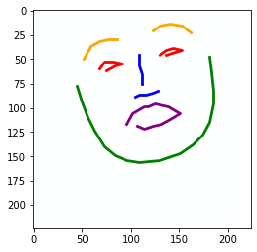

29


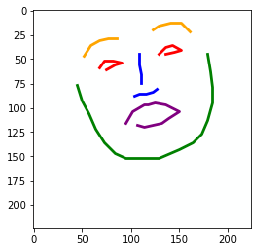

30


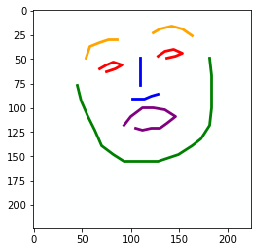

31


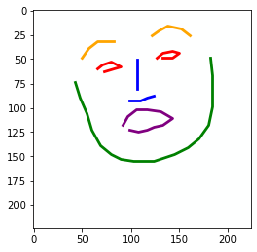

32


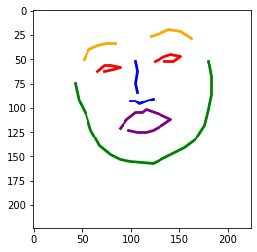

33


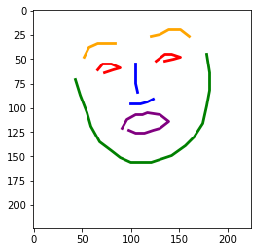

34


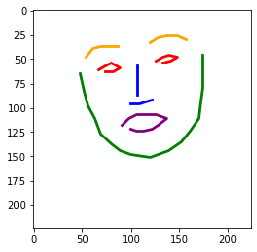

35


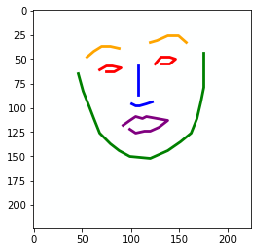

36


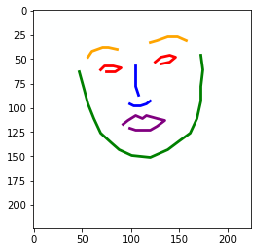

37


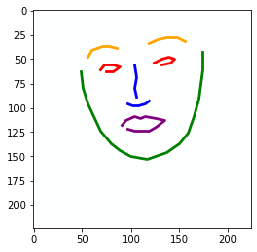

38


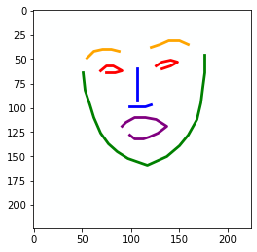

39


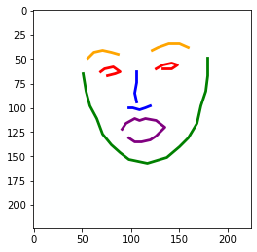

40


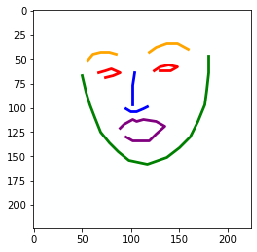

41


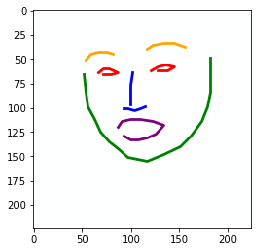

42


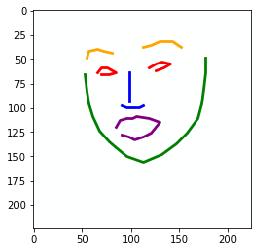

43


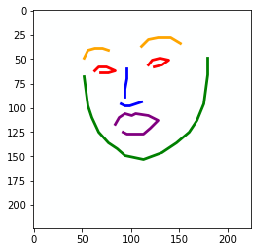

44


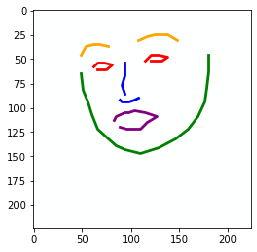

45


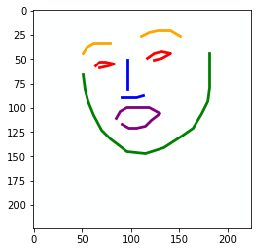

46


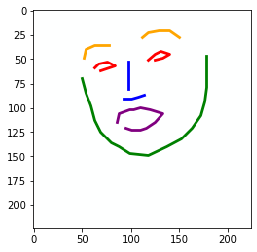

47


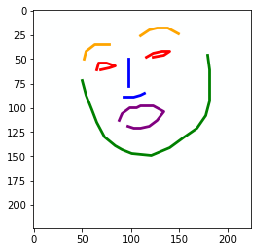

48


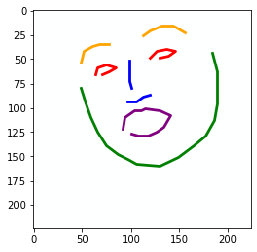

49


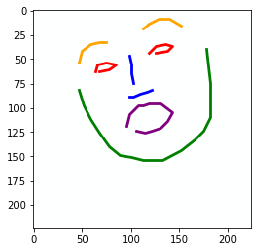

50


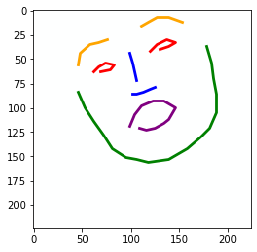

51


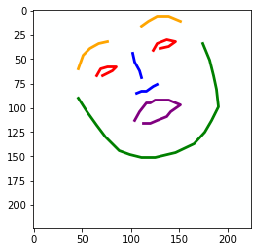

52


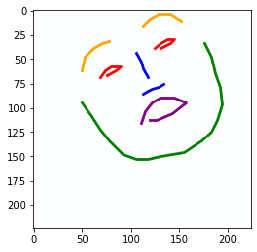

53


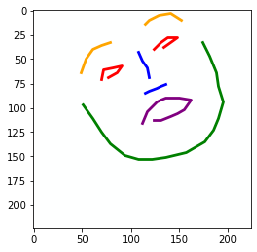

54


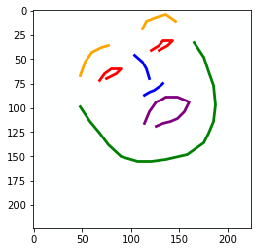

55


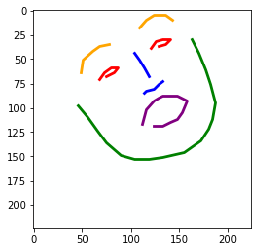

56


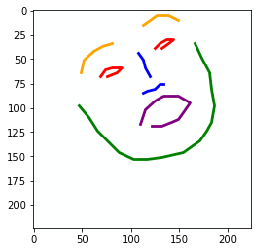

57


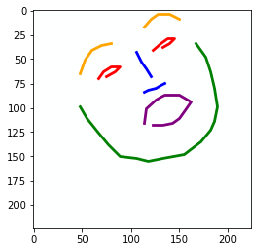

58


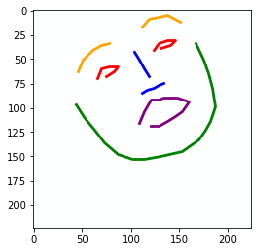

59


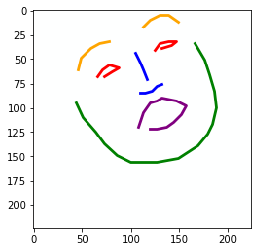

60


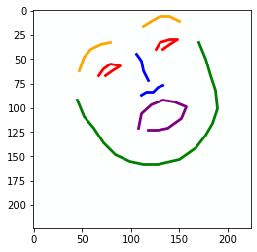

61


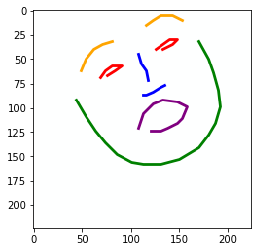

62


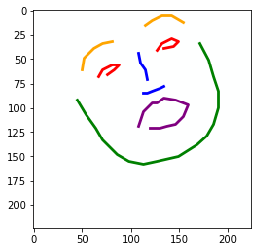

63


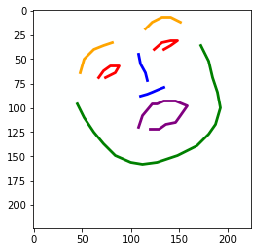

64


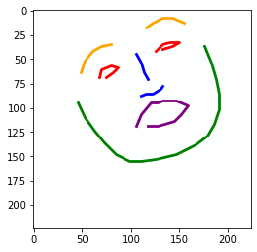

65


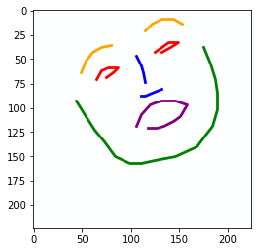

66


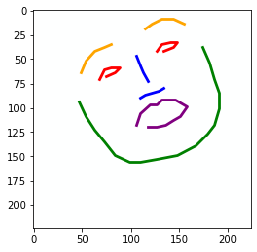

67


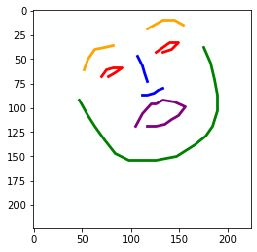

68


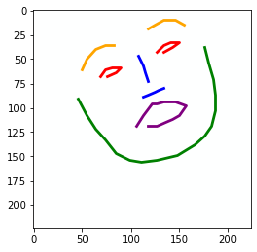

69


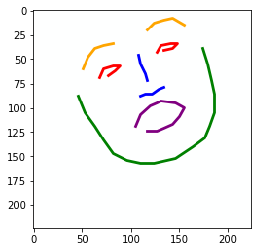

70


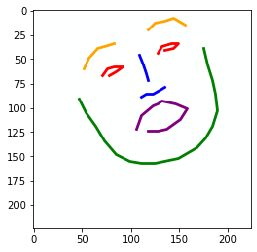

71


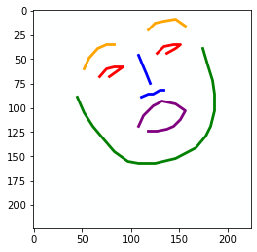

72


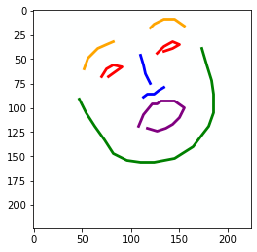

73


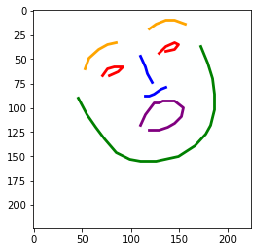

74


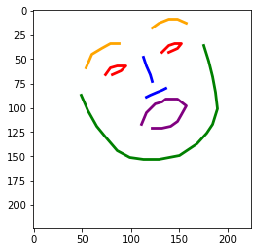

75


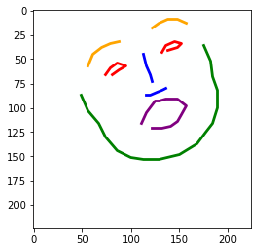

76


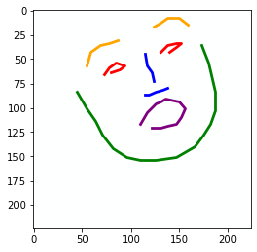

77


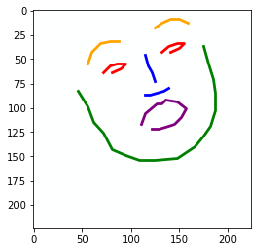

78


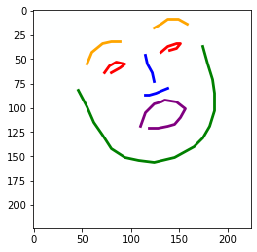

79


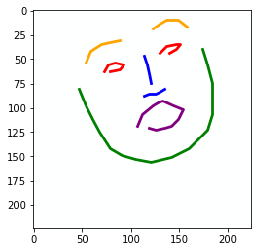

80


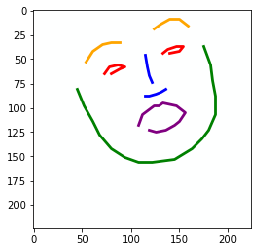

81


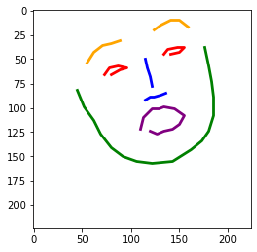

82


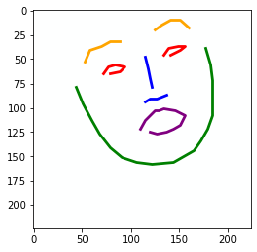

83


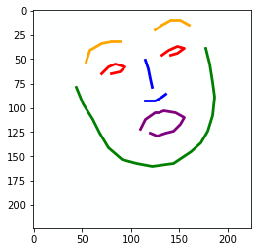

84


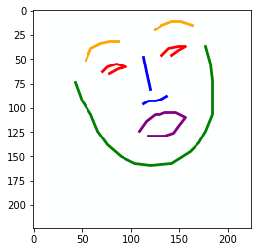

85


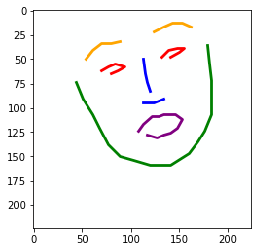

86


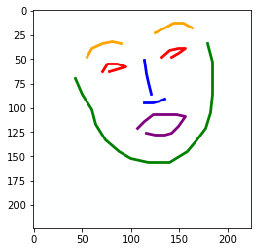

87


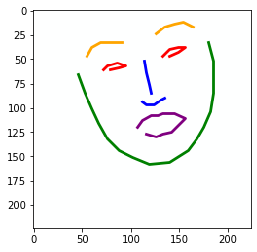

88


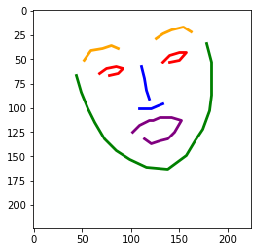

89


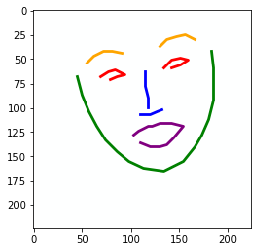

90


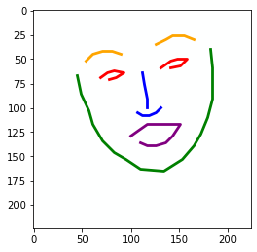

91


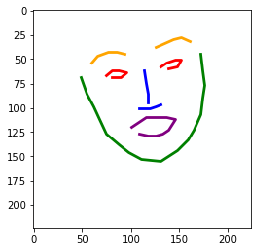

92


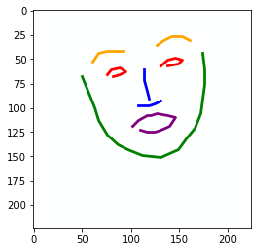

93


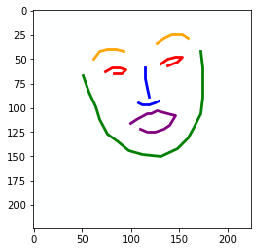

94


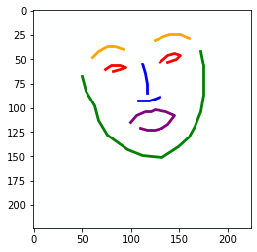

95


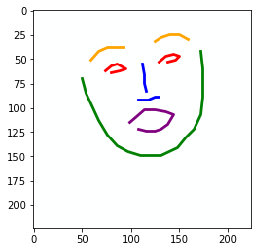

96


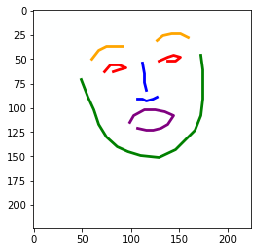

97


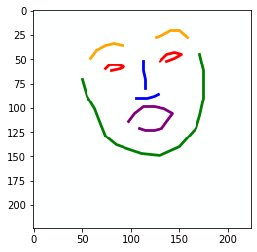

98


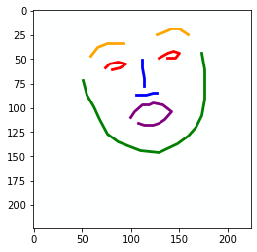

99


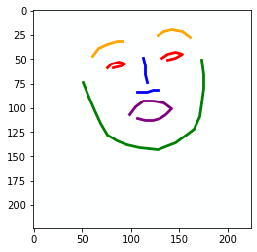

100


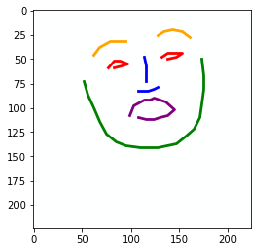

101


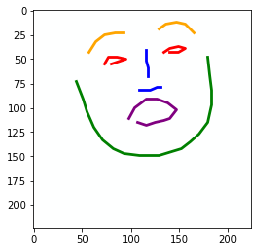

102


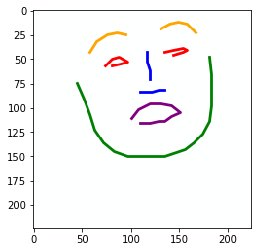

103


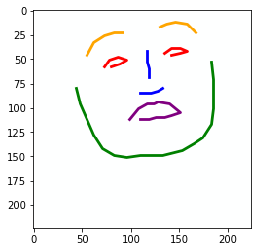

104


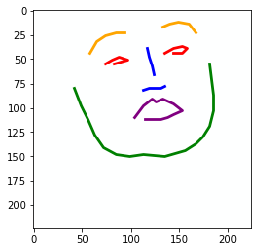

105


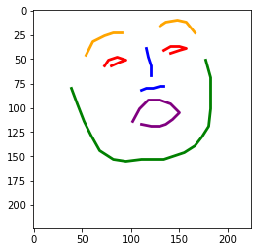

106


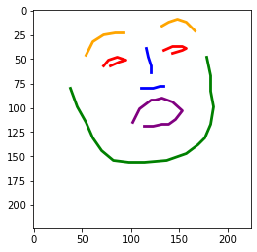

107


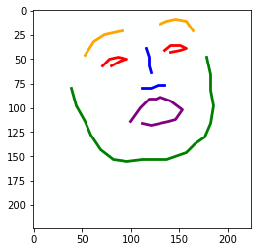

108


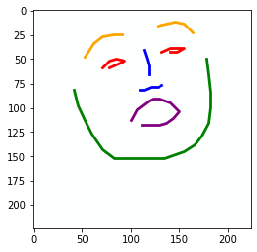

109


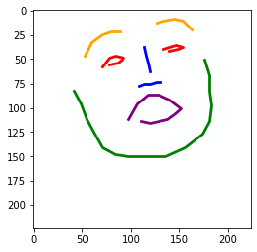

110


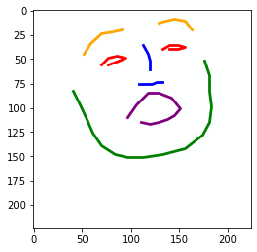

111


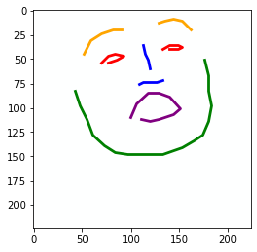

112


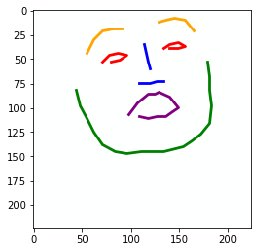

113


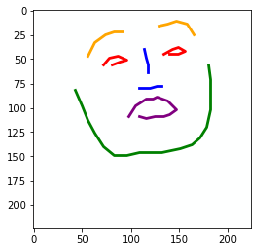

114


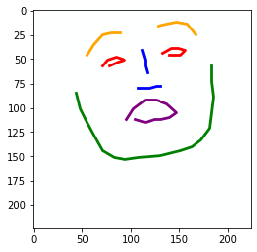

115


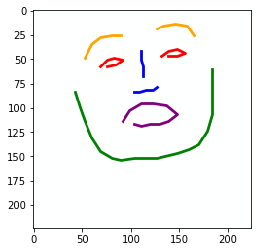

116


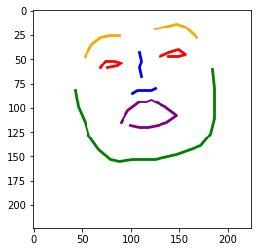

117


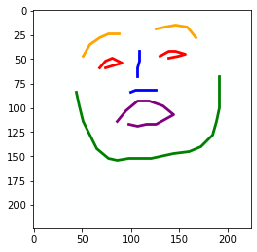

118


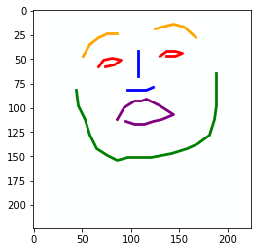

119


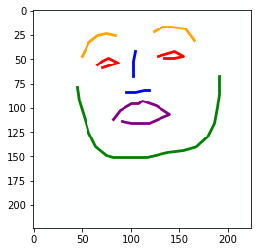

120


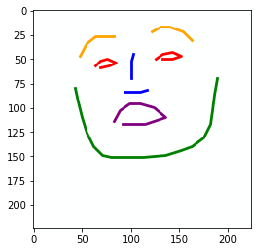

121


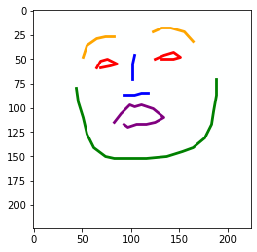

122


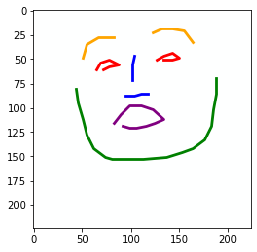

123


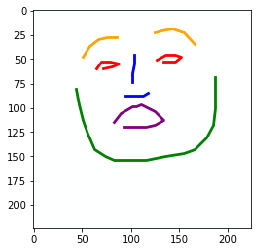

124


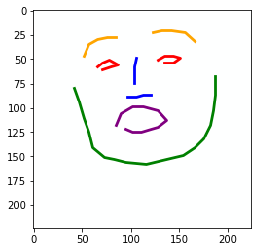

125


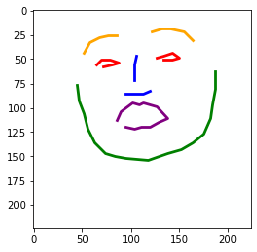

126


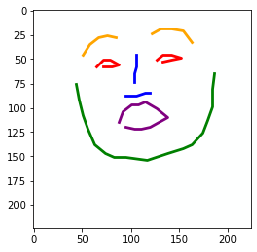

127


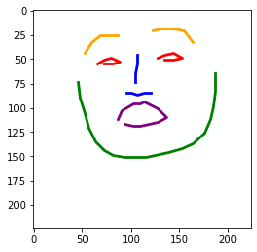

In [39]:
for i, s in enumerate(landmark_video):
    y_s = s['landmarks'].type(dtype)
    print(i)
    imshow(y_s)

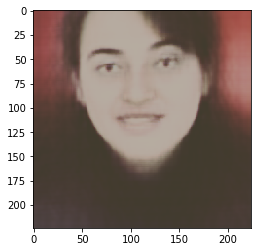

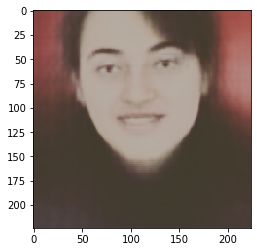

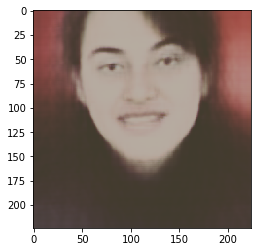

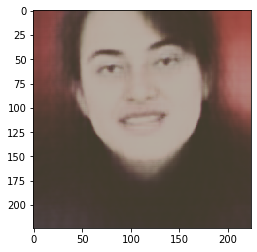

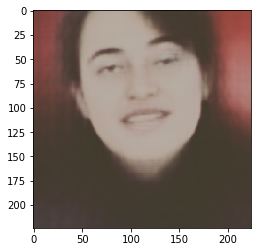

...

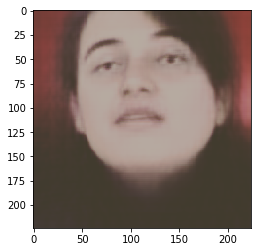

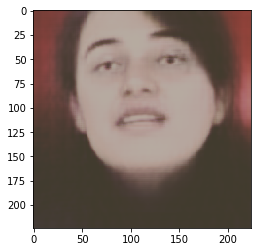

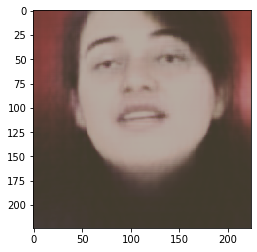

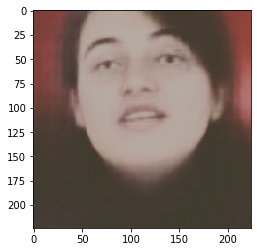

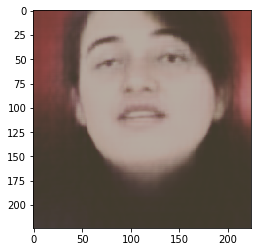

In [40]:
pathIn= './generated_img_6/'
pathOut = 'generated_video6.avi'

idx = 1

if not os.path.isdir(pathIn):
    os.makedirs(pathIn)
        
for s in landmark_video:
    y_s = s['landmarks'].type(dtype)
    x_hat = G(y_s, e_hat)
    imshow(x_hat)
    save_image(os.path.join(pathIn, f'{idx}.png'), x_hat)
    idx = idx + 1

In [22]:
len(landmark_video)

128

In [41]:
import cv2
import numpy as np
import os
 
from os.path import isfile, join
pathIn= './generated_img_6/'
pathOut = 'generated_video6.avi'

In [42]:
def convert_frames_to_video(pathIn,pathOut,fps):
    frame_array = []
    files = [f for f in os.listdir(pathIn) if isfile(join(pathIn, f))]
 
    #for sorting the file names properly
    #files.sort(key=lambda f: int(filter(str.isdigit, f)))
    files.sort(key = lambda x: int(os.path.splitext(x)[0]))
 
    for i in range(len(files)):
        filename=pathIn + files[i]
        #reading each files
        img = cv2.imread(filename)
        height, width, layers = img.shape
        size = (width,height)
        print(filename)
        #inserting the frames into an image array
        frame_array.append(img)
 
    out = cv2.VideoWriter(pathOut,cv2.VideoWriter_fourcc(*'DIVX'), fps, size)
 
    for i in range(len(frame_array)):
        # writing to a image array
        out.write(frame_array[i])
    out.release()
 

In [43]:
fps = 26.0
convert_frames_to_video(pathIn, pathOut, fps)

./generated_img_6/1.png
./generated_img_6/2.png
./generated_img_6/3.png
./generated_img_6/4.png
./generated_img_6/5.png
./generated_img_6/6.png
./generated_img_6/7.png
./generated_img_6/8.png
./generated_img_6/9.png
./generated_img_6/10.png
./generated_img_6/11.png
./generated_img_6/12.png
./generated_img_6/13.png
./generated_img_6/14.png
./generated_img_6/15.png
./generated_img_6/16.png
./generated_img_6/17.png
./generated_img_6/18.png
./generated_img_6/19.png
./generated_img_6/20.png
./generated_img_6/21.png
./generated_img_6/22.png
./generated_img_6/23.png
./generated_img_6/24.png
./generated_img_6/25.png
./generated_img_6/26.png
./generated_img_6/27.png
./generated_img_6/28.png
./generated_img_6/29.png
./generated_img_6/30.png
./generated_img_6/31.png
./generated_img_6/32.png
./generated_img_6/33.png
./generated_img_6/34.png
./generated_img_6/35.png
./generated_img_6/36.png
./generated_img_6/37.png
./generated_img_6/38.png
./generated_img_6/39.png
./generated_img_6/40.png
./generat

In [ ]:
#cap = cv2.VideoCapture(pathOut)

#while(cap.isOpened()):
#    ret, frame = cap.read()

#    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

#    cv2.imshow('frame',gray)
#    if cv2.waitKey(1) & 0xFF == ord('q'):
#        break

#cap.release()
#cv2.destroyAllWindows()